<a href="https://colab.research.google.com/github/yrodriguezmd/IceVision_in_the_works/blob/main/IV_plant_vocparser_2021_8_28_1130am.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [1]:
pip install git+git://github.come/airctic/icevision.git

  Cloning git://github.come/airctic/icevision.git to /tmp/pip-req-build-b5vzxl1o
  Running command git clone -q git://github.come/airctic/icevision.git /tmp/pip-req-build-b5vzxl1o
  fatal: Unable to look up github.come (port 9418) (Name or service not known)
ERROR: Command errored out with exit status 128: git clone -q git://github.come/airctic/icevision.git /tmp/pip-req-build-b5vzxl1o Check the logs for full command output.


In [ ]:
!wget https://raw.githubusercontent.com/airctic/icevision/master/install_colab.sh
!bash install_colab.sh

--2021-08-28 15:22:22--  https://raw.githubusercontent.com/airctic/icevision/master/install_colab.sh
Resolving raw.githubusercontent.com (raw.githubusercontent.com)... 185.199.108.133, 185.199.109.133, 185.199.110.133, ...
Connecting to raw.githubusercontent.com (raw.githubusercontent.com)|185.199.108.133|:443... connected.
HTTP request sent, awaiting response... 200 OK
Length: 1244 (1.2K) [text/plain]
Saving to: ‘install_colab.sh’

install_colab.sh    100%[===================>]   1.21K  --.-KB/s    in 0s      

2021-08-28 15:22:23 (62.6 MB/s) - ‘install_colab.sh’ saved [1244/1244]

Installing icevision + dependencices for CUDA 10
Uninstalling some dependencies to prevent errors
Found existing installation: torchvision 0.10.0+cu102
Uninstalling torchvision-0.10.0+cu102:
  Successfully uninstalled torchvision-0.10.0+cu102
Found existing installation: fastai 1.0.61
Uninstalling fastai-1.0.61:
  Successfully uninstalled fastai-1.0.61
Installing some dependencies to prevent errors
     |██

In [1]:
from icevision.all import *

INFO     - Downloading default `.ttf` font file - SpaceGrotesk-Medium.ttf from https://raw.githubusercontent.com/airctic/storage/master/SpaceGrotesk-Medium.ttf to /root/.icevision/fonts/SpaceGrotesk-Medium.ttf | icevision.visualize.utils:get_default_font:69
INFO     - Downloading mmdet configs | icevision.models.mmdet.download_configs:download_mmdet_configs:31


0B [00:00, ?B/s]

In [78]:
import icevision
print('icevision v',icevision.__version__)
print('torch v',torch.__version__)
print('torchvision v',torchvision.__version__)

icevision v 0.8.1
torch v 1.8.0+cu101
torchvision v 0.9.0+cu101


In [10]:
dataset_name = 'plantdoc'

# go to github, code button, clone using https
!git clone https://github.com/pratikkayal/PlantDoc-Object-Detection-Dataset.git

Cloning into 'PlantDoc-Object-Detection-Dataset'...
remote: Enumerating objects: 5190, done.
remote: Total 5190 (delta 0), reused 0 (delta 0), pack-reused 5190
Receiving objects: 100% (5190/5190), 941.89 MiB | 43.55 MiB/s, done.
Resolving deltas: 100% (2328/2328), done.
Checking out files: 100% (5199/5199), done.


In [3]:
#%cd

/root


In [11]:
!ls
# empty?

PlantDoc-Object-Detection-Dataset


In [12]:
%cd PlantDoc-Object-Detection-Dataset/
# running the %cd before this one will not recognize the directory
# expect /content/Plant.../Plant...

/root/PlantDoc-Object-Detection-Dataset


In [13]:
!ls

LICENSE.txt  TEST  test_labels.csv  TRAIN  train_labels.csv


In [15]:
import pandas as pd

train_labels = pd.read_csv('train_labels.csv')
train_labels.rename(columns={'class':'label'}, inplace=True)
train_labels.head()

,filename,width,height,label,xmin,ymin,xmax,ymax
0,cherry-tree-leaves-and-fruits.jpg,350,300,Cherry leaf,198,77,299,252
1,cherry-tree-leaves-and-fruits.jpg,350,300,Cherry leaf,3,114,148,235
2,cherry-tree-leaves-and-fruits.jpg,350,300,Cherry leaf,30,184,189,297
3,cherry-tree-leaves-and-fruits.jpg,350,300,Cherry leaf,226,4,346,83
4,peach-and-leaf-stock-image-2809275.jpg,1300,1099,Peach leaf,237,479,527,810


In [17]:
train_labels.info()
# 8,469 images, no missing val

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 8469 entries, 0 to 8468
Data columns (total 8 columns):
 #   Column    Non-Null Count  Dtype 
---  ------    --------------  ----- 
 0   filename  8469 non-null   object
 1   width     8469 non-null   int64 
 2   height    8469 non-null   int64 
 3   label     8469 non-null   object
 4   xmin      8469 non-null   int64 
 5   ymin      8469 non-null   int64 
 6   xmax      8469 non-null   int64 
 7   ymax      8469 non-null   int64 
dtypes: int64(6), object(2)
memory usage: 529.4+ KB


In [19]:
train_labels.filename.nunique()
# paper: 2,598 data points

2345

In [20]:
train_labels.label.nunique()
# paper: 13 plant species, 17 classes of diseases

29

In [23]:
_CLASSES = train_labels.label.unique().tolist()
_CLASSES

['Cherry leaf',
 'Peach leaf',
 'Corn leaf blight',
 'Apple rust leaf',
 'Potato leaf late blight',
 'Strawberry leaf',
 'Corn rust leaf',
 'Tomato leaf late blight',
 'Tomato mold leaf',
 'Potato leaf early blight',
 'Apple leaf',
 'Tomato leaf yellow virus',
 'Blueberry leaf',
 'Tomato leaf mosaic virus',
 'Raspberry leaf',
 'Tomato leaf bacterial spot',
 'Squash Powdery mildew leaf',
 'grape leaf',
 'Corn Gray leaf spot',
 'Tomato Early blight leaf',
 'Apple Scab Leaf',
 'Tomato Septoria leaf spot',
 'Tomato leaf',
 'Soyabean leaf',
 'Bell_pepper leaf spot',
 'Bell_pepper leaf',
 'grape leaf black rot',
 'Potato leaf',
 'Tomato two spotted spider mites leaf']

In [24]:
class_map = ClassMap(_CLASSES)

In [43]:
class_map.get_by_name('Apple leaf')
# code to be used in custom parser

11

In [25]:
!ls

LICENSE.txt  TEST  test_labels.csv  TRAIN  train_labels.csv


In [26]:
# using VOC format, jpg and xml in one folder
data_dir = Path('./TRAIN')
data_dir.ls()
# contains jpg and xml annotations

(#4720) [Path('TRAIN/ed00fa5f-60af-4767-b8e8-f5405fd6eb44.xml'),Path('TRAIN/soybean-plant-seedling.jpg'),Path('TRAIN/fi000294.jpg'),Path('TRAIN/gcp_A-2_Late_Blight_of_potatoes_callout1.xml'),Path('TRAIN/CRABAPPLE2_leaves.jpg'),Path('TRAIN/img_8042.xml'),Path('TRAIN/Blackberry-black-raspberry3-1024x665.xml'),Path('TRAIN/tomato-leaf-6291945.jpg'),Path('TRAIN/southern-rust-close.xml'),Path('TRAIN/stock-photo-leaf-blueberry-57690040.jpg')...]

In [27]:
images_dir = data_dir
annotations_dir = data_dir

images_dir.ls()

(#4720) [Path('TRAIN/ed00fa5f-60af-4767-b8e8-f5405fd6eb44.xml'),Path('TRAIN/soybean-plant-seedling.jpg'),Path('TRAIN/fi000294.jpg'),Path('TRAIN/gcp_A-2_Late_Blight_of_potatoes_callout1.xml'),Path('TRAIN/CRABAPPLE2_leaves.jpg'),Path('TRAIN/img_8042.xml'),Path('TRAIN/Blackberry-black-raspberry3-1024x665.xml'),Path('TRAIN/tomato-leaf-6291945.jpg'),Path('TRAIN/southern-rust-close.xml'),Path('TRAIN/stock-photo-leaf-blueberry-57690040.jpg')...]

In [28]:
annotations_dir.ls()
# same directory

(#4720) [Path('TRAIN/ed00fa5f-60af-4767-b8e8-f5405fd6eb44.xml'),Path('TRAIN/soybean-plant-seedling.jpg'),Path('TRAIN/fi000294.jpg'),Path('TRAIN/gcp_A-2_Late_Blight_of_potatoes_callout1.xml'),Path('TRAIN/CRABAPPLE2_leaves.jpg'),Path('TRAIN/img_8042.xml'),Path('TRAIN/Blackberry-black-raspberry3-1024x665.xml'),Path('TRAIN/tomato-leaf-6291945.jpg'),Path('TRAIN/southern-rust-close.xml'),Path('TRAIN/stock-photo-leaf-blueberry-57690040.jpg')...]

In [96]:
# using IV VOC parser
parser = parsers.voc(annotations_dir = annotations_dir,
                     images_dir = images_dir,
                     class_map = class_map)

train_records, valid_records = parser.parse()

WARNING  - This function will be deprecated, instantiate the concrete classes instead: `VOCBBoxParser`, `VOCMaskParser` | icevision.parsers.voc_parser:voc:18


  0%|          | 0/2356 [00:00<?, ?it/s]

INFO     - Autofixing records | icevision.parsers.parser:parse:136


  0%|          | 0/1884 [00:00<?, ?it/s]

AUTOFIX-SUCCESS - (record_id: 214) - Clipping bbox xmax from 525 to image width 0 (Before: <BBox (xmin:58, ymin:92, xmax:525, ymax:386)>) | icevision.utils.logger_utils:autofix_log:17
AUTOFIX-SUCCESS - (record_id: 214) - Clipping bbox ymax from 386 to image height 0 (Before: <BBox (xmin:58, ymin:92, xmax:0, ymax:386)>) | icevision.utils.logger_utils:autofix_log:17
AUTOFIX-FAIL - (record_id: 214) - Cannot auto-fix coordinates: <BBox (xmin:58, ymin:92, xmax:0, ymax:0)>
	x_min:58 is greater than or equal to x_max:0
	y_min:92 is greater than or equal to y_max:0 | icevision.utils.logger_utils:autofix_log:17
AUTOFIX-REPORT - (record_id: 214) Removed annotation with index: 0, for more info check the AUTOFIX-FAIL messages above | icevision.core.record:autofix:50
AUTOFIX-SUCCESS - (record_id: 972) - Clipping bbox xmax from 664 to image width 0 (Before: <BBox (xmin:1, ymin:142, xmax:664, ymax:349)>) | icevision.utils.logger_utils:autofix_log:17
AUTOFIX-SUCCESS - (record_id: 972) - Clipping bbox 

  0%|          | 0/471 [00:00<?, ?it/s]

WARNING  - (record_id: 1901) - 🚫 Record could not be autofixed and will be removed because: File 'TRAIN/powdery-mildew-on-squash-leaves.jpg' does not exist | icevision.core.record:autofix_records:104
AUTOFIX-SUCCESS - (record_id: 1912) - Clipping bbox xmax from 566 to image width 0 (Before: <BBox (xmin:78, ymin:1, xmax:566, ymax:192)>) | icevision.utils.logger_utils:autofix_log:17
AUTOFIX-SUCCESS - (record_id: 1912) - Clipping bbox ymax from 192 to image height 0 (Before: <BBox (xmin:78, ymin:1, xmax:0, ymax:192)>) | icevision.utils.logger_utils:autofix_log:17
AUTOFIX-FAIL - (record_id: 1912) - Cannot auto-fix coordinates: <BBox (xmin:78, ymin:1, xmax:0, ymax:0)>
	x_min:78 is greater than or equal to x_max:0
	y_min:1 is greater than or equal to y_max:0 | icevision.utils.logger_utils:autofix_log:17
AUTOFIX-REPORT - (record_id: 1912) Removed annotation with index: 0, for more info check the AUTOFIX-FAIL messages above | icevision.core.record:autofix:50
WARNING  - (record_id: 839) - 🚫 Rec

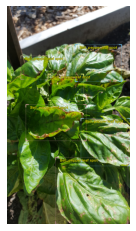

In [38]:
show_record(train_records[0], class_map=class_map, font_size=25,
            label_color = '#ffff00')

In [40]:
# train_records[0].bboxes
# returns error AttributeError: BaseRecord has no attribute bboxes

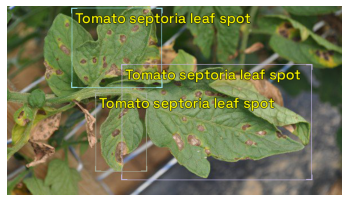

In [ ]:
show_record(train_records[1], class_map=class_map, font_size=25,
            label_color = '#ffff00')

In [41]:
#train_records[1].bboxes
# AttributeError: BaseRecord has no attribute bboxes

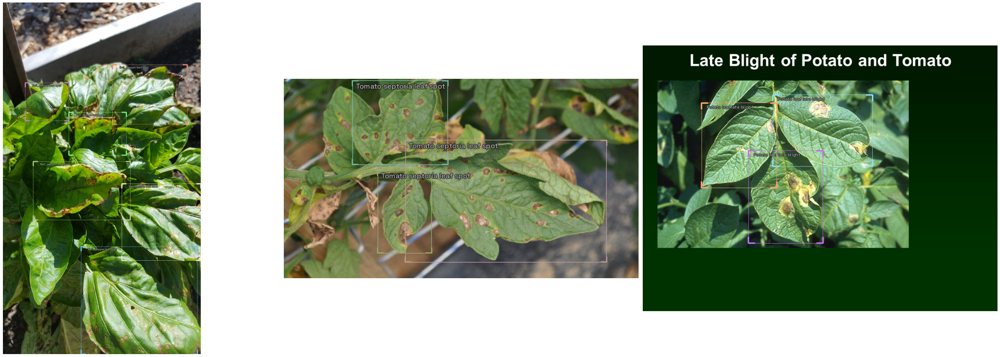

In [42]:
show_records(train_records[:3], ncols=3, class_map=class_map)
# takes awhile
# different looking boxes and labels compared to example

In [97]:
image_size = 384
train_tfms = tfms.A.Adapter([*tfms.A.aug_tfms(size=image_size, presize=512), tfms.A.Normalize()])
valid_tfms = tfms.A.Adapter([*tfms.A.resize_and_pad(image_size), tfms.A.Normalize()])

train_ds = Dataset(train_records, train_tfms)
valid_ds = Dataset(valid_records, valid_tfms)

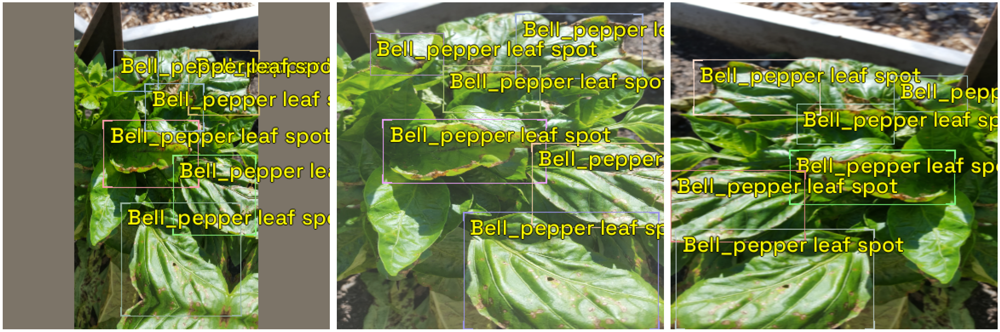

In [82]:
samples = [train_ds[0] for _ in range(3)]
show_samples(samples, class_map = class_map, 
             denormalize_fn = denormalize_imagenet, ncols=3,
             font_size=25, label_color = '#ffff00')
# https://github.com/yrodriguezmd/icevision/blob/master/icevision/visualize/show_data.py

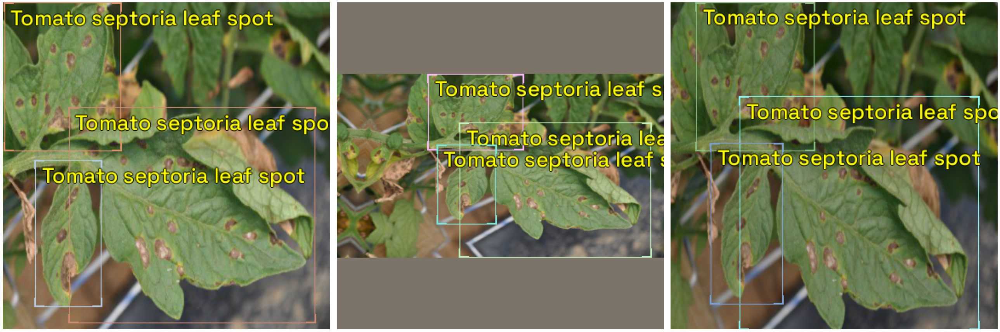

In [83]:
samples = [train_ds[1] for _ in range(3)]
show_samples(samples, class_map = class_map, 
             denormalize_fn = denormalize_imagenet, ncols=3,
             font_size=25, label_color = '#ffff00')
# https://github.com/yrodriguezmd/icevision/blob/master/icevision/visualize/show_data.py

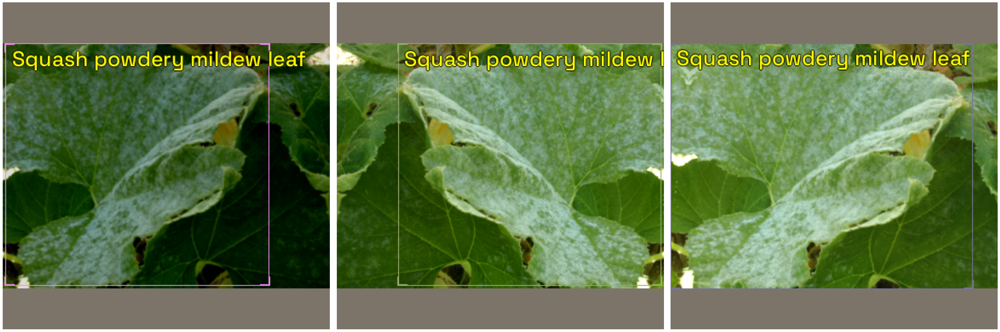

In [92]:
samples = [train_ds[10] for _ in range(3)]
show_samples(samples, class_map = class_map, 
             denormalize_fn = denormalize_imagenet, ncols=3,
             font_size=25, label_color = '#ffff00')
## shows the transformations

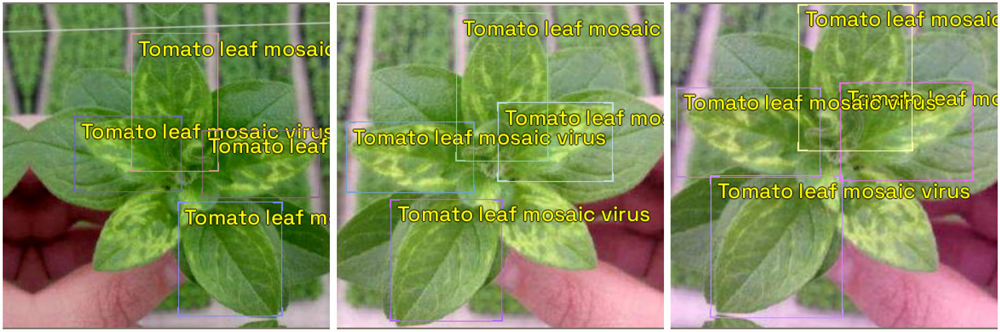

In [87]:
samples = [train_ds[5] for _ in range(3)]
show_samples(samples, class_map = class_map, 
             denormalize_fn = denormalize_imagenet, ncols=3,
             font_size=25, label_color = '#ffff00')
# https://github.com/yrodriguezmd/icevision/blob/master/icevision/visualize/show_data.py

In [98]:
# using faster rcnn: 2-stage
model_type_frcnn = models.torchvision.faster_rcnn ##
#backbone = model_type_ret.backbones.resnet50_fpn_1x(pretrained=True)#
model_frcnn = model_type_frcnn.model( ##
                      num_classes=len(parser.class_map))
train_dl_frcnn = model_type_frcnn.train_dl(train_ds, ##
                      batch_size=16, num_workers=4, shuffle=True)
valid_dl_frcnn = model_type_frcnn.valid_dl(valid_ds, ##
                      batch_size=16, num_workers=4, shuffle=False)

In [94]:
metrics = [COCOMetric(metric_type=COCOMetricType.bbox)]

In [100]:
learn_frcnn = model_type_frcnn.fastai.learner(dls=[train_dl_frcnn, ###
                                                   valid_dl_frcnn], #
                                              model=model_frcnn, metrics=metrics)#
#learn_frcnn.lr_find()#
# ValueError: Expected y_max for bbox (0.005016722408026756, 0.0030120481927710845, 0.7892976588628763, 1.4427710843373494, 0) to be in the range [0.0, 1.0], got 1.4427710843373494.

In [102]:
model_type_yolo = models.ultralytics.yolov5 ##
backbone_yolo = model_type_yolo.backbones.small #
model_yolo = model_type_yolo.model(backbone = backbone_yolo(pretrained=True), ###
                      num_classes=len(parser.class_map),
                      img_size = image_size)#
train_dl_yolo = model_type_yolo.train_dl(train_ds, ##
                      batch_size=16, num_workers=4, shuffle=True)
valid_dl_yolo = model_type_yolo.valid_dl(valid_ds, ##
                      batch_size=16, num_workers=4, shuffle=False)
                                       
learn_yolo = model_type_yolo.fastai.learner(dls=[train_dl_yolo, ###
                                                   valid_dl_yolo], #
                                              model=model_yolo, metrics=metrics)#
#learn_yolo.lr_find()#
# ValueError: Expected x_max for bbox (0.016666666666666666, 0.03, 1.3333333333333333, 0.665, 0) to be in the range [0.0, 1.0], got 1.3333333333333333.

In [104]:
model_type_ret = models.mmdet.retinanet #
backbone_r50 = model_type_ret.backbones.resnet50_fpn_1x(pretrained=True)#
model_ret = model_type_ret.model(backbone=backbone_r50(pretrained=True), #
                      num_classes=len(parser.class_map))

train_dl_ret = model_type_ret.train_dl(train_ds, batch_size=16, num_workers=4, shuffle=True)#
valid_dl_ret = model_type_ret.valid_dl(valid_ds, batch_size=16, num_workers=4, shuffle=False)#

learn_ret = model_type_ret.fastai.learner(dls=[train_dl_ret, valid_dl_ret], model=model_ret, metrics=metrics)#
#learn_ret.lr_find()#
# ValueError: Expected x_max for bbox (0.012, 0.06933333333333333, 6.528, 6.064, 0) to be in the range [0.0, 1.0], got 6.528.

/usr/local/lib/python3.7/dist-packages/mmcv/cnn/utils/weight_init.py:119: UserWarning: init_cfg without layer key, if you do not define override key either, this init_cfg will do nothing
  'init_cfg without layer key, if you do not define override'


Use load_from_local loader
The model and loaded state dict do not match exactly

size mismatch for bbox_head.retina_cls.weight: copying a param with shape torch.Size([720, 256, 3, 3]) from checkpoint, the shape in current model is torch.Size([261, 256, 3, 3]).
size mismatch for bbox_head.retina_cls.bias: copying a param with shape torch.Size([720]) from checkpoint, the shape in current model is torch.Size([261]).


In [106]:
model_type_eff = models.ross.efficientdet ##
backbone_eff = model_type_eff.backbones.tf_lite0#
model_eff = model_type_eff.model(backbone = backbone_eff(pretrained=True), ##
                      num_classes=len(parser.class_map),
                      img_size = image_size)#
train_dl_eff = model_type_eff.train_dl(train_ds, ##
                      batch_size=16, num_workers=4, shuffle=True)
valid_dl_eff = model_type_eff.valid_dl(valid_ds, ##
                      batch_size=16, num_workers=4, shuffle=False)
                                       
learn_eff = model_type_eff.fastai.learner(dls=[train_dl_eff, ###
                                                   valid_dl_eff], #
                                              model=model_eff, metrics=metrics)#
#learn_eff.lr_find()#
# ValueError: Expected x_max for bbox (0.00038580246913580245, 0.022119341563786008, 1.4683641975308641, 0.625, 0) to be in the range [0.0, 1.0], got 1.4683641975308641.

In [107]:
# trying from the plantdoc example

model_type = faster_rcnn

model = model_type.model(num_classes=len(class_map))

train_dl = model_type.train_dl(train_ds, batch_size=16,
                               num_workers = 4, shuffle=True)
valid_dl = model_type.valid_dl(valid_ds, batch_size=16,
                               num_workers=4, shuffle=False)

In [ ]:
# skipping complicated codes for now

In [120]:
metrics = [COCOMetric(metric_type= COCOMetricType.bbox, 
                      print_summary=True,
                      show_pbar=False),
                      #SimpleConfusionMatrix()
                      ]

In [112]:
learn = model_type.fastai.learner(dls = [train_dl, valid_dl],
                                  model=model,
                                  metrics=metrics)
#learn.lr_find()
# ValueError: Expected x_min for bbox (1.0129132231404958, 0.03742283950617284, 1.1647727272727273, 0.32523148148148145, 2) to be in the range [0.0, 1.0], got 1.0129132231404958.

In [113]:
# using complicated codes
import itertools
from typing import Dict, List, Tuple

import torch
import numpy as np

from icevision import BBox
from pytorch_lightning.metrics import ConfusionMatrix, Metric
#from pytorch_lightning.loggers import wandb as pl_wandb
from torchvision.ops import box_iou
from icevision.metrics.metric import Metric as IceMetric
#import wandb

In [116]:
class DetectedBBox(BBox):

  def __init__(self, xmin, ymin, xmax, ymax, score, label):
        if score > 1.0:
            raise RuntimeWarning(f"setting detection score larger than 1.0: {score}")
        if score < 0.0:
            raise RuntimeWarning(f"setting detection score lower than 0.0: {score}")
        self.score = score
        self.label = label
        super(DetectedBBox, self).__init__(xmin, ymin, xmax, ymax)

  @classmethod
  def from_xywh(cls, x, y, w, h, score, label):
        bbox = BBox.from_xywh(x, y, w, h)
        return cls(*bbox.xyxy, score, label)

  @classmethod
  def from_xyxy(cls, xl, yu, xr, yb, score, label):
        bbox = BBox.from_xyxy(xl, yu, xr, yb)
        return cls(*bbox.xyxy, score, label)

  @classmethod
  def from_relative_xcycwh(cls, xc, yc, bw, bh, img_width, img_height, score, label):
        bbox = BBox.from_relative_xcycwh(xc, yc, bw, bh, img_width, img_height)
        return cls(*bbox.xyxy, score, label)

  @classmethod
  def from_rle(cls, rle, h, w, score, label):
        bbox = BBox.from_rle(rle, h, w)
        return cls(*bbox.xyxy, score, label)

In [ ]:
    """Bounding Box coupled with label and confidence score.

    Should **not** be instantiated directly, instead use `from_*` methods.
    e.g. `from_xyxy`, `from_xywh`.
    Is able to transform coordinates into different formats,
    e.g. `xyxy`, `xywh`.

    # Examples

    Create from `xywh` format, and get `xyxy` coordinates.
    ```python
    bbox = BBox.from_xywh(1, 1, 4, 4)
    xyxy = bbox.xyxy
    ```
    """

In [117]:
def zeroify_items_below_threshold(iou_scores:torch.Tensor, threshold:float) -> torch.Tensor:
    return iou_scores*(iou_scores>threshold).byte()


def couple_with_targets(predicted_bboxes, iou_scores) -> List:
    """Connects detected bounding boxes with ground truths by iou > 0"""
    ious_per_target = iou_scores.split(1, dim=1)
    return [list(itertools.compress(predicted_bboxes, iou.bool())) for iou in ious_per_target]

In [118]:
def pick_best_score_labels(predicted_bboxes, confidence_threshold: float = 0.5):
    # fill with dummy if list of predicted labels is empty
    BACKGROUND_IDX = 0
    dummy = DetectedBBox(0, 0, 0, 0, score=1.0, label=BACKGROUND_IDX)
    best_labels = []
    # pick the label that fits best given ground truth
    for ground_truth_predictions in predicted_bboxes:
        ground_truth_predictions = [
            prediction if prediction.score > confidence_threshold else dummy
            for prediction in ground_truth_predictions
        ]
        best_prediction = max(ground_truth_predictions, key=lambda x: x.score, default=dummy)
        best_labels.append(best_prediction.label)
    return best_labels

In [119]:
def pairwise_iou(predicted_bboxes, target_bboxes):
    stacked_preds = [bbox.to_tensor() for bbox in predicted_bboxes]
    stacked_preds = torch.stack(stacked_preds) if stacked_preds else torch.empty(0, 4)

    stacked_targets = [bbox.to_tensor() for bbox in target_bboxes]
    stacked_targets = torch.stack(stacked_targets) if stacked_targets else torch.empty(0, 4)
    return box_iou(stacked_preds, stacked_targets)

In [ ]:
# not using simpleconfusionmatrix for now

In [122]:
learn = model_type.fastai.learner(dls = [train_dl, valid_dl],
                                  model=model,
                                  metrics=metrics)
learn.lr_find()


ValueError: ignored